In [1]:
import pandas as pd
import numpy as np
import river

link = '../Datasets/hit400Dataset.csv'
df = pd.read_csv(link)

df.columns


#df = df['account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type','label']

Index(['amount', 'account_age', 'holder_age', 'account_balance',
       'transaction_time', 'entry_type', 'gender', 'broswer', 'avs', 'cvv',
       'connection_type', 'card_number', 'account_type', 'location', 'bank',
       'label'],
      dtype='object')

In [2]:
from river import synth
from river import ensemble
from river import evaluate
from river import metrics

dataset = synth.ConceptDriftStream(seed=42, position=500,
                                    width=40).take(1000)

model = ensemble.AdaptiveRandomForestClassifier(
     n_models=3,
     seed=42
)

metric = metrics.Accuracy()

evaluate.progressive_val_score(df, model, metric)


ValueError: too many values to unpack (expected 2)

In [3]:
import pandas as pd
from river import stream

X= df.drop('label', axis=1)
y = df['label']

from river import compose

pp = compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder()

for xi, yi in stream.iter_pandas(X, y):
    pp = pp.learn_one(xi)
    print(pp.transform_one(xi))
    


{'broswer_Mozilla/5.0': 1, 'avs_n': 1, 'bank_First Capital Bank': 1, 'connection_type_https': 1, 'account_type_debit': 1, 'entry_type_magnetic strip': 1, 'location_Bulawayo': 1, 'gender_female': 1}
{'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'avs_n': 0, 'avs_y': 1, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Harare': 1, 'location_Bulawayo': 0, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'avs_n': 1, 'avs_y': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Harare': 0, 'location_Bulawayo': 1, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswe

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 1, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 1, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 1, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 1, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 1, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 1, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 1, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 1, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 1, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 1, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 1, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 1, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 1, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 1, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 1, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 1, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 1, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 1, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 1, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 1, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 1, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC':

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 1, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 1, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 1, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 1, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 1, 'location_Bindura': 0, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 1, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 1, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 1, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 1, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 1, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 1, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 1, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 1, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC':

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 1, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 1, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 1, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 1, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 0, 'connection_type_https': 1, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 1, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 1, 'location_Bindura': 0, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 1, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 0, 'account_type_credit': 1, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 1, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 1, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 1, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 1, 'avs_y': 0, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 1, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 0, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'location_Hwange': 0, 'location_Bulawayo': 1, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 0, 'gender_male': 0, 'gender_female': 1}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Linux x86_64': 1, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 0, 'bank_First Capital Bank': 0, 'bank_Steward Bank': 0, 'bank_FBC Bank': 1, 'connection_type_http': 1, 'connection_type_https': 0, 'account_type_debit': 1, 'account_type_credit': 0, 'entry_type_chip': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Hwange': 0, 'location_Bulawayo': 0, 'location_Kwekwe': 0, 'location_Harare': 0, 'location_Marondera': 0, 'location_Rusape': 0, 'location_Gweru': 0, 'location_Bindura': 1, 'gender_male': 1, 'gender_female': 0}
{'broswer_lk/41.0.2272.89': 0, 'broswer_Safari/537.36': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Linux x86_64': 0, 'broswer_AppleWebKit/537.36': 0, 'avs_n': 0, 'avs_y': 1, 'bank_CBZ Bank': 0, 'bank_Agribank': 0, 'bank_BANC ABC': 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [5]:
X= df.drop('label', axis=1)
y = df['label']
for  xi, yi in stream.iter_pandas(X, y):
    print(xi,yi)
    break

{'amount': 7025, 'account_age': 4030, 'holder_age': 53, 'account_balance': 1230, 'transaction_time': 5, 'entry_type': 'magnetic strip', 'gender': 'female', 'broswer': 'Mozilla/5.0', 'avs': 'n', 'cvv': 6348, 'connection_type': 'https', 'card_number': 465, 'account_type': 'debit', 'location': 'Bulawayo', 'bank': 'First Capital Bank'} True


In [4]:
from river import linear_model
from river import metrics
from river import tree
from river import neighbors

metric = metrics.
X= df.drop('label', axis=1)
y = df['label']

model1 = linear_model.LogisticRegression()
model2 = ensemble.AdaptiveRandomForestClassifier(
     n_models=3,
     seed=42
)

model3 = ensemble.AdaBoostClassifier(
     model=(
         tree.HoeffdingTreeClassifier(
             split_criterion='gini',
             split_confidence=1e-5,
             grace_period=2000
         )
     ),
     n_models=5,
     seed=42
)

model4 = neighbors.KNNClassifier()

model5 =  linear_model.ALMAClassifier() 

metric = metrics.ROCAUC()

for  xi, yi in stream.iter_pandas(X, y):
    #y_pred1 = model1.predict_proba_one(xi)
    #y_pred2 = model2.predict_proba_one(xi)
    #y_pred3 = model3.predict_proba_one(xi)
    y_pred4 = model4.predict_proba_one(xi)
    #y_pred5 = model5.predict_proba_one(xi)
    
    model1.learn_one(xi, yi)
    model2.learn_one(xi, yi)
    #model3.learn_one(xi, yi)
    model4.learn_one(xi, yi)
    #model5.learn_one(xi, yi)
    
    #met1 = metric.update(yi, y_pred1)
    #met2 = metric.update(yi, y_pred2)
    #met3 = metric.update(yi, y_pred3)
    met4 = metric.update(yi, y_pred4)
    #met5 = metric.update(yi, y_pred5)
    
    stats  = {
    #    'LogisticRegression':met1,
     #   'Adaptive Random Forest Classifier':met2,
    #    'AdaBoostClassifier':met3,
        'KNN Classifier':met4,
    #    'ALMAClassifier':met5
    }

stats

TypeError: can't multiply sequence by non-int of type 'float'

In [81]:
from river import compose
from river import preprocessing
from river import linear_model
from river import metrics
from river import tree
from river import neighbors

model1 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    ensemble.AdaptiveRandomForestClassifier(
     n_models=3,
     seed=42
)
)


model2 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    linear_model.LogisticRegression()
)


model3 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    ensemble.AdaBoostClassifier(
     model=(
         tree.HoeffdingTreeClassifier(
             split_criterion='gini',
             split_confidence=1e-5,
             grace_period=2000
         )
     ),
     n_models=5,
     seed=42
)

)

model4 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    linear_model.ALMAClassifier() 
)

models = {
    'Adaptive Random Forest Classifier':model1, 
    'LogisticRegression':model2, 
    'AdaBoostClassifier':model3, 
    'ALMA Classifier':model4
}




ValueError: too many values to unpack (expected 2)

In [105]:
from river import compose
from river import preprocessing
from river import linear_model
from river import metrics
from river import tree
from river import neighbors

metric = metrics.ROCAUC()
models = {
    'Adaptive Random Forest Classifier':model1, 
    'LogisticRegression':model2, 
    'AdaBoostClassifier':model3, 
    'ALMA Classifier':model5
}
#models = [model1, model2, model3, model5]

X= df.drop('label', axis=1)
y = df['label']
stats = {}

for i, (name, model) in enumerate(models.items()):
    for xi, yi in stream.iter_pandas(X, y):
        y_pred = model.predict_proba_one(xi)
        model.learn_one(xi, yi)
        met = metric.update(yi, y_pred)    
    print(name)
    print('Accuracy Score:>',met)
    metric = metrics.ROCAUC()
    print('-------------------------------------------------------------')

Adaptive Random Forest Classifier
Accuracy Score:> ROCAUC: 0.999946
-------------------------------------------------------------
LogisticRegression
Accuracy Score:> ROCAUC: 0.517681
-------------------------------------------------------------
AdaBoostClassifier
Accuracy Score:> ROCAUC: 0.70847
-------------------------------------------------------------
ALMA Classifier
Accuracy Score:> ROCAUC: 0.502984
-------------------------------------------------------------


In [95]:


stats = {
    'Adaptive Random Forest Classifier':0.882, 
    'LogisticRegression':0.6977, 
    'AdaBoostClassifier':0.6395, 
    'ALMA Classifier':0.6115
}

In [96]:
stats

{'Adaptive Random Forest Classifier': 0.882,
 'LogisticRegression': 0.6977,
 'AdaBoostClassifier': 0.6395,
 'ALMA Classifier': 0.6115}

In [97]:
#creating a table of classifiers and thier accuracy
ca = [[a,b] for a,b in stats.items()]
ca = pd.DataFrame(ca, columns=['Classifier','Accuracy'])
ca

,Classifier,Accuracy
0,Adaptive Random Forest Classifier,0.8820
1,LogisticRegression,0.6977
2,AdaBoostClassifier,0.6395
3,ALMA Classifier,0.6115


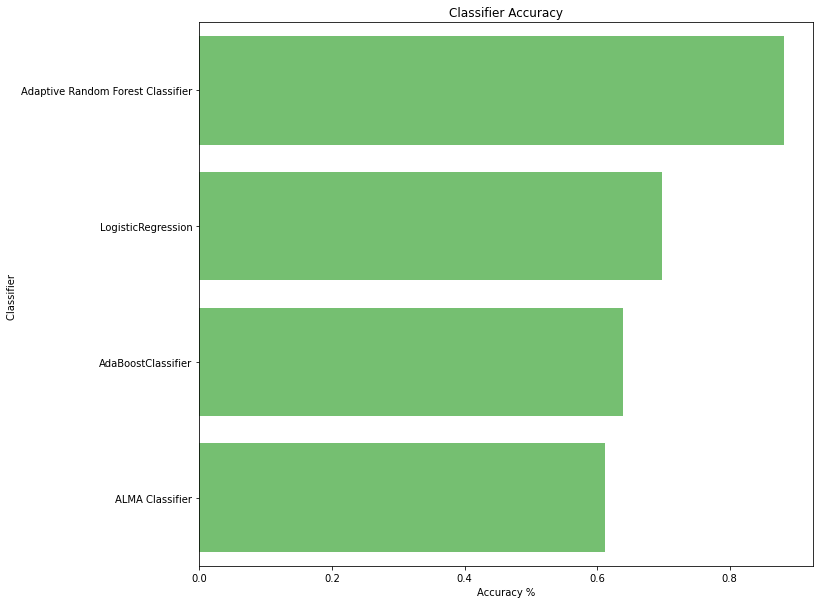

In [101]:
#plotting classifiers and thier accuracy
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import  rcParams
rcParams['figure.figsize'] = 11,10

sns.set_color_codes('muted')
sns.barplot(x='Accuracy', y='Classifier', data=ca, color='g')
plt.xlabel('Accuracy %')
plt.ylabel('Classifier ')
plt.title('Classifier Accuracy')
plt.show()


In [39]:
from pprint import pprint
import random
import string

random.seed(4)
alphabet = list(string.ascii_lowercase)
X = [
     {
         'c1': random.choice(alphabet),
         'c2': random.choice(alphabet),
     }
     for _ in range(4)
 ]
pprint(X)
X = pd.read_csv('tv_shows.csv')
X = X.to_dict()
X

[{'c1': 'h', 'c2': 'j'},
 {'c1': 'd', 'c2': 'x'},
 {'c1': 'm', 'c2': 'p'},
 {'c1': 'e', 'c2': 'c'}]


{'gender': {0: 'male', 1: 'female', 2: 'male', 3: 'female', 4: 'male'},
 'age': {0: 2016, 1: 2006, 2: 2001, 3: 2008, 4: 2019},
 'worth': {0: 9.5, 1: 9.4, 2: 9.4, 3: 9.4, 4: 9.4}}

In [38]:
import river.preprocessing

oh = river.preprocessing.OneHotEncoder(sparse=True)
for x in X:
     oh = oh.learn_one(x)
     pprint(oh.transform_one(x))


AttributeError: 'str' object has no attribute 'items'

In [33]:
from river import compose

pp = compose.Select('c1') | river.preprocessing.OneHotEncoder()

for x in X:
     pp = pp.learn_one(x)
     pprint(pp.transform_one(x))


{'c1_h': 1}
{'c1_d': 1, 'c1_h': 0}
{'c1_d': 0, 'c1_h': 0, 'c1_m': 1}
{'c1_d': 0, 'c1_e': 1, 'c1_h': 0, 'c1_m': 0}


In [3]:
from sklearn.metrics import classification_report, accuracy_score
from river import compose
from river import preprocessing
from river import linear_model
from river import metrics
from river import tree
from river import neighbors
from river import ensemble
from river import stream

In [4]:
model1 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    ensemble.AdaptiveRandomForestClassifier(
     n_models=4,
     seed=42
)
)

In [10]:
import river
from river import compose
from river import preprocessing
from river import linear_model
from river import metrics
from river import tree
from river import neighbors
from river import ensemble
from river import stream
import pandas as pd
link = '../Datasets/hit400Dataset.csv'
df = pd.read_csv(link)

rocauc = metrics.ROCAUC()
recall = metrics.Recall()
precision = metrics.Precision()
accracy = metrics.Accuracy()

model = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    ensemble.AdaptiveRandomForestClassifier(
     n_models=4,
     seed=42
)
)

models = {
    'Adaptive Random Forest Classifier':model, 
}
df = df[:1000]
X= df.drop('label', axis=1)
y = df['label']
stats = {}
print('MODEL PERFOMANCE STATS')
print('<--------------------------------------------->')
for i, (name, model) in enumerate(models.items()):
    for xi, yi in stream.iter_pandas(X, y):
        pred = model.predict_proba_one(xi)
        
        if pred[True] == 1:
            y_pred = True
        elif pred[False] == 1:
            y_pred = False
        elif pred[True]> pred[False]:
            y_pred = True
        else:
            y_pred= False
        model.learn_one(xi, yi)
        met1 = rocauc.update(yi, y_pred)
        met2 = accracy.update(yi, y_pred)
        met3 = precision.update(yi, y_pred)
        met4 = recall.update(yi, y_pred)
         
    print('rocauc:',met1.get())
    print('accuracy:',met2.get())
    print('precision',met3.get())
    print('recall',met4.get())
    #metric = metrics.ROCAUC()
    print('<--------------------------------------------->')

MODEL PERFOMANCE STATS
<--------------------------------------------->
rocauc: 0.521255897660392
accuracy: 0.975
precision 0.16666666666666666
recall 0.047619047619047616
<--------------------------------------------->


In [31]:
from river import metrics

y_true = ['pear', 'apple', 'banana', 'banana', 'banana']
y_pred = ['apple', 'pear', 'banana', 'banana', 'apple']

report = metrics.ClassificationReport()

for xi, yi in stream.iter_pandas(X, y):
    y_pred = model.predict_proba_one(xi)
    model.learn_one(xi, yi)
    print(yi, y_pred)
    #report = report.update(yi, y_pred)

#print(report)


True {False: 1.8789104733058552e-05, True: 0.9999812108952669}
False {False: 1.0, True: 0.0}
False {False: 0.9925348985044297, True: 0.007465101495570295}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9908245538944751, True: 0.009175446105524948}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.417693782313645e-18}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9927394627985215, True: 0.0072605372014784494}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999933725808233, True: 6.627419176746958e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9927705553638586, True: 0.0072294446361413885}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False 

False {False: 1.0, True: 0.0}
False {False: 0.9999433505098763, True: 5.6649490123733766e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9721202264093332, True: 0.02787977359066678}
False {False: 1.0, True: 0.0}
False {False: 0.9826580492361418, True: 0.017341950763858287}
False {False: 0.9828417314483943, True: 0.017158268551605755}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9967600171057647, True: 0.003239982894235339}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.054135497849075e-79}
False {False: 0.9999916780015217, True: 8.321998478365525e-06}
False {False: 0.9958127531710247, True: 0.004187246828975281}
False {False: 0.880992696279208, True: 0.11900730372079203}
False {False: 1.0, True: 0.0}
False {False: 0.7538068782012097, True: 0.24619312179879033}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False

False {False: 1.0, True: 0.0}
False {False: 0.9999999994322054, True: 5.677945772646384e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9999999993704393, True: 6.295607852942902e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.8359473799807733e-33}
False {False: 1.0, True: 5.2325998180993334e-30}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999991138290534, True: 8.861709466424243e-07}
False {False: 0.7483756662962502, True: 0.2516243337037498}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999965805512356, True: 3.419448764377309e-06}
False {False: 0.9999978614793663, True: 2.1385206337301104e-06}
False {False: 0.9999999992998205, True: 7.001794684009258e-10}
False {False: 0.9999999999602237, True: 3.977626278019111e-11}
False {False: 0.7483858160873033, True: 0.2516141839126967}
False {False: 1.0, True: 0.0}
False {False: 0.9999956965278736, True: 

False {False: 0.8964563680462297, True: 0.10354363195377024}
False {False: 0.9860998161010994, True: 0.013900183898900558}
False {False: 1.0, True: 0.0}
False {False: 0.9999937049521955, True: 6.295047804541673e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999981369592, True: 1.863040737890671e-09}
False {False: 0.9999897212494394, True: 1.0278750560610671e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999465616734623, True: 5.343832653773511e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9342981410549027, True: 0.0657018589450973}
False {False: 0.750825195540196, True: 0.24917480445980392}
False {False: 1.0, True: 0.0}
False {False: 0.8981378081163217, True: 0.10186219188367834}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999998187383126, True: 1.8126168745203404e-07}
False {False: 1.0, 

False {False: 1.0, True: 0.0}
False {False: 0.9996589514583125, True: 0.00034104854168744906}
False {False: 0.9590517686521135, True: 0.040948231347886554}
False {False: 0.7480685468700464, True: 0.2519314531299536}
False {False: 0.9999999999999942, True: 5.694889952443743e-15}
False {False: 1.0, True: 0.0}
False {False: 0.8571017452628131, True: 0.14289825473718684}
False {False: 0.9352146162099283, True: 0.06478538379007169}
False {False: 0.7508322829784625, True: 0.2491677170215375}
False {False: 0.8359221642187874, True: 0.16407783578121266}
False {False: 0.9642905411864509, True: 0.03570945881354912}
False {False: 0.9992962149545842, True: 0.0007037850454158423}
False {False: 0.9999977381699617, True: 2.2618300382224177e-06}
False {False: 0.9382759982864941, True: 0.06172400171350591}
False {False: 1.0, True: 0.0}
False {False: 0.9901491216690504, True: 0.009850878330949544}
False {False: 1.0, True: 0.0}
False {False: 0.9999956600049332, True: 4.339995066764218e-06}
False {False: 

False {False: 0.754843454966591, True: 0.24515654503340895}
False {False: 0.9693079439623088, True: 0.030692056037691255}
False {False: 1.0, True: 0.0}
False {False: 0.9684300195444975, True: 0.03156998045550253}
False {False: 1.0, True: 0.0}
False {False: 0.958034179030984, True: 0.041965820969016084}
False {False: 0.9756364749390891, True: 0.0243635250609109}
False {False: 0.7482446201637861, True: 0.2517553798362139}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9664903692488811, True: 0.03350963075111893}
False {False: 0.9708394442174119, True: 0.029160555782588138}
False {False: 0.9999748402221147, True: 2.5159777885390532e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9765037698760024, True: 0.023496230123997635}
False {False: 0.9987674668117068, True: 0.0012325331882932062}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.97711425

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.998224931922894, True: 0.0017750680771060406}
False {False: 0.9840837084405787, True: 0.015916291559421324}
False {False: 0.9844372872910951, True: 0.015562712708904814}
False {False: 0.985386513456717, True: 0.014613486543282983}
False {False: 0.8923372319526626, True: 0.10766276804733749}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.848857158410481e-83}
False {False: 0.9804184680945541, True: 0.01958153190544595}
False {False: 0.9788662024270385, True: 0.021133797572961504}
False {False: 0.9827198517485576, True: 0.017280148251442442}
False {False: 0.9808196254363437, True: 0.019180374563656278}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.8936387065087585, True: 0.10636129349124152}
False {False: 0.9814834691222802, True: 0.018516530877719695}
False {False: 1.0, True: 0.0}
False {False: 0.7527716122545889, True: 0.2472283877454111}
Fals

False {False: 1.0, True: 0.0}
False {False: 0.9999981789529495, True: 1.8210470505333786e-06}
False {False: 0.9887290211914002, True: 0.011270978808599817}
False {False: 0.9740296404148561, True: 0.02597035958514389}
False {False: 0.9868261150486631, True: 0.01317388495133687}
False {False: 0.9888298885802084, True: 0.011170111419791613}
False {False: 0.9889615917596897, True: 0.011038408240310328}
False {False: 1.0, True: 0.0}
False {False: 0.989215895803363, True: 0.010784104196637041}
False {False: 1.0, True: 0.0}
False {False: 0.985568915645054, True: 0.014431084354945965}
False {False: 1.0, True: 0.0}
False {False: 0.9898900781633596, True: 0.0101099218366404}
False {False: 1.0, True: 0.0}
False {False: 0.9999984037289299, True: 1.596271070097638e-06}
False {False: 0.9999984161587954, True: 1.583841204629142e-06}
False {False: 0.9999504694723569, True: 4.9530527643115406e-05}
False {False: 0.9930862936846439, True: 0.006913706315356082}
False {False: 0.9892776872301361, True: 0.01

False {False: 0.9977606367412442, True: 0.002239363258755821}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999952, True: 4.770321916791237e-15}
False {False: 1.0, True: 0.0}
False {False: 0.9999999438415668, True: 5.615843318289974e-08}
False {False: 0.9921522755896741, True: 0.007847724410325956}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9952722662498802, True: 0.00472773375011981}
False {False: 0.9999999995625051, True: 4.374949540796754e-10}
False {False: 0.9980730690557833, True: 0.0019269309442167036}
False {False: 0.9637997567094689, True: 0.03620024329053103}
False {False: 0.9999999994670116, True: 5.32988469323463e-10}
False {False: 1.0, True: 0.0}
False {False: 0.998087941636339, True: 0.0019120583636609576}
False {False: 0.9931076412256983, True: 0.006892358774301754}
False {False: 0.9495302800392076, True: 0.050469719960792414}
False {False: 0.9999999999957511, True: 4.2489856953074795e-12}
False {Fal

False {False: 0.9442427713717108, True: 0.05575722862828929}
False {False: 0.8260670641829163, True: 0.17393293581708372}
False {False: 0.9797832857503912, True: 0.020216714249608848}
False {False: 0.988445851588346, True: 0.011554148411654013}
False {False: 0.9916757488568674, True: 0.008324251143132651}
False {False: 0.9972151910460441, True: 0.0027848089539559465}
False {False: 0.9935775858961056, True: 0.006422414103894498}
False {False: 0.9999925021343208, True: 7.49786567913333e-06}
False {False: 0.7683340977552123, True: 0.23166590224478764}
False {False: 0.9999999990197928, True: 9.802072217576052e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9999999844644719, True: 1.553552805008197e-08}
False {False: 0.9869023582763632, True: 0.013097641723636748}
False {False: 0.9963197159112951, True: 0.0036802840887049265}
False {False: 0.7893207552679453, True: 0.21067924473205468}
False {False: 0.9999999938965226, True: 6.1034773305064235e-09}
False {False: 0.9875137762983782, True:

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9983294573576647, True: 0.0016705426423354497}
False {False: 0.989670848204077, True: 0.010329151795922979}
False {False: 1.0, True: 0.0}
False {False: 0.9999999986164152, True: 1.383584808276806e-09}
False {False: 1.0, True: 0.0}
False {False: 0.9999999993925608, True: 6.074391879075476e-10}
False {False: 0.9998579560875873, True: 0.00014204391241271063}
False {False: 1.0, True: 0.0}
False {False: 0.7528462369959017, True: 0.24715376300409836}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999879051839607, True: 1.209481603922889e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9795090377309282, True: 0.02049096226907178}
False {False: 0.9795050004079547, True: 0.020494999592045288}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9796909589805083, True: 0.02030904101949172}
False {False: 1.0, True: 0.0}
False {False: 1.0,

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9838014484431378, True: 0.016198551556862163}
False {False: 0.9562590575688272, True: 0.0437409424311728}
False {False: 1.0, True: 0.0}
False {False: 0.9839251845698795, True: 0.016074815430120553}
False {False: 0.9910714256169445, True: 0.00892857438305548}
False {False: 0.9999999977326162, True: 2.267383818748681e-09}
False {False: 1.0, True: 0.0}
False {False: 0.9825716034079518, True: 0.017428396592048225}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9985079612479701, True: 0.0014920387520298316}
False {False: 0.98413700780623, True: 0.015862992193769992}
False {False: 0.9998954420222029, True: 0.00010455797779706323}
False {False: 1.0, True: 0.0}
False {False: 0.9841441558406054, True: 0.015855844159394596}
False {False: 0.9999375864465134, True: 6.241355348654551e-05}
False {False: 0.95

False {False: 0.9711664353571932, True: 0.02883356464280686}
False {False: 1.0, True: 0.0}
False {False: 0.999999997958663, True: 2.0413369900396686e-09}
False {False: 0.9999923067076671, True: 7.69329233291831e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999987133085, True: 1.2866914984377657e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999944858037774, True: 5.514196222651039e-06}
False {False: 0.9981353023705654, True: 0.0018646976294346789}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9846571126548928, True: 0.01534288734510728}
False {False: 0.9999954464049337, True: 4.553595066267334e-06}
False {False: 0.9847307872768525, True: 0.015269212723147492}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999990077085209, True: 9.922914790877662e-06}
False {False: 1.0, True: 0.0}
False {False: 1.

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.811411081629416e-17}
False {False: 1.0, True: 0.0}
False {False: 0.9999999983526031, True: 1.6473969811830233e-09}
False {False: 0.9999969235964505, True: 3.0764035494722445e-06}
False {False: 1.0, True: 0.0}
False {False: 0.9959014278686236, True: 0.004098572131376426}
False {False: 0.9999999989605851, True: 1.0394148515162813e-09}
False {False: 1.0, True: 0.0}
False {False: 0.9950806004388413, True: 0.004919399561158749}
False {False: 0.9914477402194978, True: 0.008552259780502204}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999990944071, True: 9.055929311272752e-10}
False {False: 0.9999999995382762, True: 4.617237072100567e-10}
False {False: 0.9999999992475526, True: 7.524473680411095e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9999999989788231, True: 1.0211769528407713e-09}
False {False: 0.9959891186698275, True: 0.004010881330172545}
False {False: 0.9999999989401195, True: 1.0598804

False {False: 0.988217330203001, True: 0.011782669796998987}
False {False: 1.0, True: 6.403881895697392e-26}
False {False: 1.0, True: 0.0}
False {False: 0.7489092235608329, True: 0.25109077643916716}
False {False: 1.0, True: 3.5843617285613556e-129}
False {False: 0.9952548079575317, True: 0.00474519204246833}
False {False: 1.0, True: 0.0}
False {False: 0.9999999919899706, True: 8.01002939199011e-09}
False {False: 0.9875343575011123, True: 0.012465642498887737}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.024098429456559e-257}
False {False: 0.9999999979161427, True: 2.0838572926968565e-09}
False {False: 0.9845022126498779, True: 0.015497787350122095}
False {False: 0.9999831203577154, True: 1.6879642284568164e-05}
False {False: 0.9999858933183617, True: 1.4106681638229136e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9953054272865625, True: 0.004694572713437504}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, T

False {False: 0.992585169077323, True: 0.0074148309226770666}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999968965433, True: 3.1034567127349635e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9926292230228088, True: 0.00737077697719133}
False {False: 0.976443303997642, True: 0.02355669600235797}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9927555779653603, True: 0.007244422034639706}
False {False: 1.0, True: 5.0862405194499896e-55}
False {False: 1.0, True: 0.0}
False {False: 0.9940878202360416, True: 0.005912179763958448}
False {False: 1.0, True: 0.0}
False {False: 0.9999998468304752, True: 1.5316952487978597e-07}
False {False: 0.7706203900775027, True: 0.22937960992249729}
False {False: 0.9796728751575914, True: 0.02032712484240854}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7050444236775337, True: 0.29495557632246633}
False {False: 0.9814486225684061,

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9786497803299714, True: 0.02135021967002852}
False {False: 0.9692778947705881, True: 0.030722105229411913}
False {False: 1.0, True: 1.3715278703799158e-35}
False {False: 0.9838116014207523, True: 0.01618839857924771}
False {False: 1.0, True: 0.0}
False {False: 0.9844224956035477, True: 0.015577504396452337}
False {False: 0.9699552265974298, True: 0.030044773402570116}
False {False: 0.9843621819565742, True: 0.015637818043425733}
False {False: 0.9848047125000027, True: 0.015195287499997285}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9709171562659169, True: 0.029082843734083073}
False {False: 1.0, True: 0.0}
False {False: 0.9716238741010067, True: 0.02837612589899323}
False {False: 0.9854587975427618, True: 0.01454120245723818}
False {False: 1.0, True: 0.0}
False {False: 0.9856829024145497, True: 0.014317097585450305}
Fal

False {False: 0.9135467159353611, True: 0.08645328406463892}
False {False: 1.0, True: 0.0}
False {False: 0.986892511170522, True: 0.013107488829478046}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.112149935711103e-291}
False {False: 1.0, True: 0.0}
False {False: 0.9871438861896921, True: 0.012856113810307927}
False {False: 1.0, True: 0.0}
False {False: 0.9753501658342676, True: 0.02464983416573247}
False {False: 0.9873856741697933, True: 0.012614325830206757}
False {False: 0.9913852071501837, True: 0.008614792849816191}
False {False: 0.9876565594272139, True: 0.012343440572786205}
False {False: 0.9958860849183793, True: 0.004113915081620724}
False {False: 0.9959172551561986, True: 0.004082744843801404}
False {False: 0.9873018821114419, True: 0.012698117888558158}
False {False: 0.9959392374053422, True: 0.004060762594657769}
False {False: 0.9839499691359073, True: 0.016050030864092627}
False {False: 0.9943903583689713, True: 0.005609641631028797}
False {False: 0.987455992384

False {False: 0.9396154031274567, True: 0.06038459687254319}
False {False: 0.9999998085832393, True: 1.9141676066093494e-07}
False {False: 0.9829247582327962, True: 0.017075241767203795}
False {False: 1.0, True: 0.0}
False {False: 0.955552682776254, True: 0.044447317223745945}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999903118424, True: 9.688157621377624e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9889875155719019, True: 0.01101248442809808}
False {False: 0.9998397575848779, True: 0.00016024241512216603}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9890434658317008, True: 0.010956534168299191}
False {False: 1.0, True: 0.0}
False {False: 0.9363656160732757, True: 0.06363438392672428}
False {False: 0.9923954695124508, True: 0.007604530487549181}
False {False: 1.0, True: 0.0}
False {False: 1.0, 

False {False: 1.0, True: 0.0}
False {False: 0.7470287428744812, True: 0.2529712571255189}
False {False: 0.9944063680523679, True: 0.005593631947632053}
False {False: 0.9926726546129754, True: 0.0073273453870246925}
False {False: 0.9971147861161868, True: 0.0028852138838132563}
False {False: 1.0, True: 0.0}
False {False: 0.9971366730417237, True: 0.0028633269582763157}
False {False: 1.0, True: 2.2953020494231813e-196}
False {False: 1.0, True: 0.0}
False {False: 0.9871796662072619, True: 0.012820333792738132}
False {False: 0.9899125643890535, True: 0.010087435610946532}
False {False: 0.9999938846998156, True: 6.115300184405228e-06}
False {False: 0.9972712084885291, True: 0.0027287915114708834}
False {False: 0.9995310174872297, True: 0.00046898251277029417}
True {False: 0.47201044703844375, True: 0.5279895529615563}
True {False: 0.05424985960133976, True: 0.9457501403986602}
True {False: 0.345692628913182, True: 0.654307371086818}
True {False: 0.5066872252591066, True: 0.4933127747408934}

False {False: 1.0, True: 0.0}
False {False: 0.9866783724487291, True: 0.013321627551270868}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999502042653085, True: 4.979573469162467e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9799264748823426, True: 0.020073525117657358}
False {False: 0.9999999999782843, True: 2.171570482468008e-11}
False {False: 0.980992848532114, True: 0.019007151467885956}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999999999167769, True: 8.322309193122749e-10}
False {False: 0.9999999993807874, True: 6.192125304717277e-10}
False {False: 1.0, True: 0.0}
False {False: 0.999999999999984, True: 1.603163619484916e-14}
False {False: 0.9999999999999999, True: 6.215956465158697e-17}
False {False: 0.9936014073626139, True: 0.006398592637386077}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0

False {False: 1.0, True: 0.0}
False {False: 0.9999999990513708, True: 9.486291155811555e-10}
False {False: 0.9858148243919596, True: 0.01418517560804048}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9936480748143702, True: 0.006351925185629713}
False {False: 0.9999999999998371, True: 1.6286619894597517e-13}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7646926709188161, True: 0.23530732908118396}
False {False: 0.999999999999948, True: 5.196521926598901e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9936809552507502, True: 0.0063190447492497736}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9937049336607819, True: 0.006295066339218131}
False {False: 0.986118

False {False: 0.9763420219342732, True: 0.023657978065726795}
False {False: 1.0, True: 0.0}
False {False: 0.9999999995459268, True: 4.540732455817782e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9939484931020292, True: 0.006051506897970889}
False {False: 0.9999999850062612, True: 1.4993738800877074e-08}
False {False: 1.0, True: 0.0}
False {False: 0.9999999992880501, True: 7.11949994463275e-10}
False {False: 0.9999999999999515, True: 4.845767824180978e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.487446889372008e-292}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999970861626, True: 2.9138373524012763e-09}
False {False: 0.9999155664265946, True: 8.443357340536103e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999992081957, True: 7.91804273430286e-

False {False: 1.0, True: 0.0}
False {False: 0.995718503091311, True: 0.0042814969086889905}
False {False: 0.999999998842003, True: 1.1579970046659106e-09}
False {False: 0.9999999988317781, True: 1.1682218035577796e-09}
False {False: 0.9842231822096361, True: 0.01577681779036395}
False {False: 0.988560759180383, True: 0.011439240819617032}
False {False: 0.995828231623354, True: 0.004171768376646012}
False {False: 0.9589210963744632, True: 0.04107890362553681}
False {False: 0.99588407492403, True: 0.004115925075970062}
False {False: 0.9959023597105217, True: 0.0040976402894782925}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9959384494625105, True: 0.004061550537489472}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999989580242, True: 1.0419757892317027e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9437448659429347, True: 0.056255134057065316}
False {False: 0.

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9881219616110265, True: 0.011878038388973474}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9788136813931457, True: 0.02118631860685433}
False {False: 0.9791648714593192, True: 0.020835128540680776}
False {False: 1.0, True: 0.0}
False {False: 0.9855794108029566, True: 0.0144205891970434}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 8.289922474144516e-86}
False {False: 0.9793390670561691, True: 0.020660932943830874}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7486760378126146, True: 0.251

False {False: 0.9806084586248914, True: 0.01939154137510865}
False {False: 0.9866480250702031, True: 0.01335197492979691}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 7.142459785405047e-29}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999920072148366, True: 7.992785163410894e-06}
False {False: 0.9999999805265337, True: 1.947346632703748e-08}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999998992920339, True: 1.0070796610119191e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999475238153216, True: 5.247618467833769e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9996251179413823, True: 0.0003748820586176807}
False {False: 1.0, True: 2.5001315910358643e-69}
False {False: 1.0, True: 1.2987826351349304e-7

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9926911606840992, True: 0.0073088393159007545}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9345000994804131, True: 0.06549990051958679}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9865403822174953, True: 0.01345961778250469}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9867612038042239, True: 0.01323879619577608}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9927960490394385, True: 0.00720395096056149}
False {False: 0.992885306561168, True: 0.007114693438832047}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
Fa

False {False: 1.0, True: 0.0}
False {False: 0.9488582294890692, True: 0.051141770510930835}
True {False: 0.5323704182114697, True: 0.4676295817885303}
True {False: 0.2059186784491183, True: 0.7940813215508817}
True {False: 0.6529238449123741, True: 0.34707615508762585}
True {False: 0.35439804861300855, True: 0.6456019513869914}
True {False: 0.44214188133341903, True: 0.557858118666581}
False {False: 1.0, True: 0.0}
False {False: 0.9288051827194692, True: 0.07119481728053088}
False {False: 0.9999887064563916, True: 1.1293543608460016e-05}
False {False: 0.9999966444111861, True: 3.3555888139075446e-06}
False {False: 0.9302330651279765, True: 0.06976693487202337}
False {False: 0.9999914480997165, True: 8.551900283491543e-06}
False {False: 0.9282828250124139, True: 0.07171717498758605}
False {False: 0.989850459441288, True: 0.010149540558712077}
False {False: 0.9418189864065077, True: 0.0581810135934923}
False {False: 0.9999901718694427, True: 9.82813055731405e-06}
False {False: 0.98779274

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9770650244960914, True: 0.022934975503908495}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.935971108019445, True: 0.064028891980555}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9379365757407113, True: 0.06206342425928861}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {Fa

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9905583725509123, True: 0.009441627449087702}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.0919202196101529e-216}
False {False: 0.9999760323314576, True: 2.3967668542394888e-05}
False {False: 0.9998594112181506, True: 0.00014058878184942334}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999910483072514, True: 8.951692748662375e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9929621846312352, True: 0.007037815368764753}
False {False: 1.0, True: 0.0}
False {False: 0.9908369487803936, True: 0.009163051219606356}
False {False: 0.9861295862009454, True: 0.01387041379905463}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
Fa

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.270277201647582e-38}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9783998415911913, True: 0.021600158408808696}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9938935237229017, True: 0.006106476277098341}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999042674654, True: 9.573253455887042e-08}
False {False: 1.0, True: 0.0}
False {False: 0.9541364793544197, True: 0.045

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9848050700274374, True: 0.01519492997256255}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999983437, True: 1.6562485476831888e-12}
False {False: 0.9999999998768592, True: 1.2314086410384716e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9931169826408514, True: 0.00688301735914862}
False {False: 0.9933520461474978, True: 0.006647953852502166}
False {False: 0.9651319800428484, True: 0.034868019957151504}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9658725687700341, True: 0.0341274312299659}
False {False: 0.7685946978727556, True: 0.23140530212724436}
False {False: 1.0, True: 0.0}
False {False: 0.8097022822718022, True: 0.19029771772819773}
False {False: 1.0, True: 0.0}
False {False: 0.9663644485275884, True: 0.033635551472

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9334301193518522, True: 0.06656988064814778}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9347746745283874, True: 0.06522532547161258}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999999999999748, True: 2.5195001422126507e-13}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999999999999614, True: 3.8604752697261083e-13}
False {False: 1.0, True: 0.0}
False {False: 0.9998541400497802, True: 0.00014585995021970408}
False {False: 0.9910310613445498, True: 0.008968938655450164}
False {False: 1.0, True: 0.0}
False {False: 0.9912004811231484, True: 0.008799518876851613}
False {False: 1.0, True: 0.0}
False {False: 0.9997576453163383, True: 0.00024235468366176648}
False {False: 0.991323390521115, True: 0.00867660947888495}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999994955884, True: 5.0441168471955e-10}
False {False: 0.9915782632458356, True: 0.008421736754164308}
False {False: 1.0, True: 0.0}
False {False: 0.9917094061206632, True: 0.008290593879336916}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, T

False {False: 0.9405491255499747, True: 0.05945087445002533}
False {False: 0.9877397642897238, True: 0.01226023571027628}
False {False: 0.994367120760613, True: 0.005632879239387032}
False {False: 0.994398548449332, True: 0.005601451550668019}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.994467996753991, True: 0.0055320032460090185}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.2155861130387205e-120}
False {False: 1.0, True: 2.531683912529014e-35}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9945133585291659, True: 0.005486641470834104}
False {False: 1.0, True: 0.0}
False {False: 0.8929296372233747, True: 0.10707036277662528}
False {False: 1.0, True: 0.0}
False {False: 0.9640217470417788, True: 0.035978252958221234}
False {False: 1.0, True: 0.0}
False {False: 0.9880569774156093, True: 0.011943022584390648}
False {False: 0.9945946074817701, True: 0.005405392518229989}
False {False: 1.0, True: 0.0}
False {False: 0.9

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9690436962789373, True: 0.03095630372106266}
False {False: 0.9999999999999978, True: 2.243803938989644e-15}
False {False: 0.9999999969234227, True: 3.076577376924001e-09}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999991719, True: 8.281376240057348e-13}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999982, True: 1.7836818111390697e-15}
False {False: 1.0, True: 0.0}
False {False: 0.999995079752476, True: 4.920247523935426e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.2056160422141527e-220}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999940770314, True: 5.922968583327591e-09}
False {False: 0.999999984897927

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.0885984025774704e-101}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999954255, True: 4.574471721735663e-12}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.7033128852207643e-301}
False {False: 0.9999999898545568, True: 1.0145443241305431e-08}
False {False: 1.0, True: 0.0}
False {False: 0.9866127780913775, True: 0.013387221908622555}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 8.811091694753483e-59}
False {False: 1.0, True: 0.0}
False {False: 0.9357287438774788, True: 0.06427125612252119}
True {False: 3.046685831686871e-09, True: 0.9999999969533141}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9366388643844726, True: 0.06336113561552736}
False {False: 1.0, True: 3.2244727564406552e-121}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 6.209947859676

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.987117538772419, True: 0.012882461227581013}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9949047973120778, True: 0.005095202687922193}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999920177300236, True: 7.982269976342256e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999727908352227, True: 2.720916477725106e-05}
False {False: 1.0, True: 0.0}
F

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.1414962776734051e-87}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.1189882611856e-311}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999986752, True: 1.324868705155934e-12}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999996195702, True: 3.80429767148224e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 9.221110282651292e-51}
False {False: 0.9999999972168747, True: 2.7831253577612693e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9904605141054871, True: 0.009539485894512933}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.403793422756076e-121}
False {False: 0.9999999999997643, True: 2.3566026933180774e-13}
False {False: 0.9682314292107996, True: 0.03176857078920033}
False {False: 0.9905241326225116, True: 0.009475867377488394}
False {False: 1.0, True: 0.0}
False {False: 0.920810659459849, True: 0.07918934054015109}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, T

False {False: 1.0, True: 0.0}
False {False: 0.9999999927768259, True: 7.223174050712704e-09}
False {False: 1.0, True: 3.994624885170588e-37}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.3410217326851407e-61}
False {False: 1.0, True: 0.0}
False {False: 0.999999993458486, True: 6.5415140519781625e-09}
False {False: 0.8134722786489931, True: 0.186527721351007}
False {False: 0.9999954212150277, True: 4.578784972317479e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 0.4327667207662517, True: 0.5672332792337483}
True {False: 0.04854038560318806, True: 0.9514596143968119}
True {False: 0.2356008125107804, True: 0.7643991874892195}
True {False: 0.23908434107563498, True: 0.760915658924365}
True {False: 0.015916095803058493, True: 0.9840839041969415}
True {False: 4.732491411836355e-05, True: 0.9999526750858817}
True {False: 0.24716692360566755, True: 0.7528330763943325}
True {False: 0.4608872956887976, True: 0.53911270431120

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999866726692939, True: 1.332733070606734e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9994574148812925, True: 0.0005425851187075517}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
Fals

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999996466922, True: 3.5330779581651075e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999991693605975, True: 8.306394025023031e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
Fals

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9658739531440291, True: 0.034126046855970815}
False {False: 0.9999999973023344, True: 2.6976656515529742e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9908814854696014, True: 0.00911851453039859}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.936532589052755, True: 0.06346741094724498}
False {False: 1.0, True: 1.8577509681246353e-87}
False {False: 0.9383204018562996, True: 0.061679598143700436}
False {False: 0.9701841032335973, True: 0.02981589676640275}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9285691617471256, True: 0

False {False: 1.0, True: 0.0}
False {False: 0.9671679651515922, True: 0.03283203484840785}
False {False: 0.9893980143040197, True: 0.010601985695980238}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 2.8057312952984256e-06, True: 0.9999971942687047}
False {False: 0.9679313161337894, True: 0.0320686838662106}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9895003108432135, True: 0.010499689156786434}
False {False: 0.9479964752238232, True: 0.052003524776176806}
False {False: 0.9757048378998483, True: 0.02429516210015172}
False {False: 1.0, True: 8.057021490632958e-216}
False {False: 0.9760522930410908, True: 0.023947706958909225}
False {False: 0.9999999999999998, True: 2.0399882905525845e-16}
False {False: 1.0, True: 5.091745772367964e-177}
False {False: 0.9999999971025314, True: 2.897468615079232e-09}
False {False: 0.9682269183491743, True: 0.03177308165082569}
False {False: 1.0, True: 0.0}
False {False: 0.7488124606805222, True: 0

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9537805815620561, True: 0.0462194184379439}
False {False: 1.0, True: 0.0}
False {False: 0.9999999993477465, True: 6.522533909398658e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.1159889198700387e-37}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999998959012, True: 1.040988

False {False: 1.0, True: 0.0}
False {False: 0.9999999986973901, True: 1.302609917717372e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.0994481313415724e-265}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9808448172647688, True: 0.01915

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9376170188137639, True: 0.062382981186236135}
False {False: 1.0, True: 7.739312504182625e-74}
False {False: 0.9400694477137259, True: 0.05993055228627406}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9956014732123004, True: 0.004398526787699625}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9956827142999913, True: 0.004317285700008608}
False {False: 1.0, True: 0.0}
False {False: 1

True {False: 1.025890858968919e-09, True: 0.9999999989741092}
True {False: 0.21852674384952198, True: 0.781473256150478}
False {False: 1.0, True: 0.0}
False {False: 0.9660005511036445, True: 0.03399944889635548}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999968456757838, True: 3.1543242162067897e-06}
False {False: 1.0, True: 0.0}
False {False: 0.947715957158507, True: 0.05228404284149301}
False {False: 0.8901382403146211, True: 0.10986175968537891}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9664085337379502, True: 0.033591466262049785}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.6633078025359806e-26}
False {False: 1.0, True: 0.0}
False {False

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {Fal

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999939904592777, True: 6.009540722264245e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999996958199, True: 3.041801313604545e-10}
False {False: 1.0, True: 0.0}
False {False: 0.892848093570866, True: 0.10715190642913396}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9460557481819253, True: 0.05394425181807466}
False {False: 0.9466550983509627, True: 0.0533449016490373}
False {False: 1.0, True: 0.0}
False {False: 0.9999905161232557,

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9959788858880638, True: 0.004021114111936202}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999998662, True: 1.3373082138827183e-13}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.980503116079461, True: 0.019496883920539016}
False {False: 1.0, True: 0.0}
False {False: 0.9999953766261543, True: 4.623373845634668e-06}
False {False: 1.0, True: 3.130000217653386e-17}
False {False: 1.0, True: 0.0}
False {False: 0.9999999982959064, True: 1.7040936545824751e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999995275175819, True: 4.724824181040828e-06}
False {False: 0.9999999999999997, True: 3.737115690801866e-16}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
Fal

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.223456801108124e-23}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999038078, True: 9.619220825613186e-11}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.502219193995191e-21}
False {False: 1.0, True: 0.0}
False {False: 0.9420234863918479, True: 0.05797651360815209}
True {False: 6.343268851531803e-10, True: 0.9999999993656732}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9427208296937241, True: 0.05727917030627602}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999918329148572, True: 8.167085142803039e-06}
False {False: 1.0, True: 0.0}
False {False: 0.9999358284908597, True: 6.417150914023113e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999306, True: 6.942918637516953e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999996516927, True: 3.4830723421001227e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9964999239456123, True: 0.0035000760543877213}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9965047039562297, True: 0.0034952960437703204}
False {False: 0.9999999997048004, True: 2.9519963912766466e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.509167683902665e-229}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999997334446, True: 2.665554778535786e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {F

False {False: 0.9999999909997094, True: 9.000290624713675e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999981499017, True: 1.8500983288160732e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9910442671324112, True: 0.00895573286758871}
False {False: 0.9999698057299796, True: 3.0194270020365407e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9910934798612532, True: 0.008906520138746741}
False {False: 1.0, True: 0.0}
False {False: 0.9823913930926843, True: 0.01760860690731566}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9767279225044271, True: 0.023272077495573005}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.4050525195711165e-50}
False {False: 0.9825447261921911, 

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999645597, True: 3.5440350721900707e-11}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 7.677950304484269e-19}
False {False: 1.0, True: 0.0}
False {False: 0.9307190801360139, True: 0.06928091986398609}
True {False: 9.196413177397523e-10, True: 0.9999999990803586}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.93171232338318, True: 0.06828767661682004}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.4688413082827603e-305}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9980424450001564, True: 0.0019575549998436894}
False {False: 1.0, True: 0.0}
False {False: 0.9999999997962019, True: 2.037981624183715e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999947916, True: 5.208422385481565e-12}
False {False: 1.0

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9812478389896003, True: 0.018752161010399705}
False {False: 0.9899921137969876, True: 0.010007886203012312}
False {False: 0.9816249590303483, True: 0.018375040969651667}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9782449627763762, True: 0.02175503722362375}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9783782886786321, True: 0.021621711321367934}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9950551733737492, True: 0.004944826626250867}
False {False: 1.0, True: 0.0}
False {False: 0.99020814633732, True: 0.009791853662679987}
False {False: 1.0, True: 0.0}
False {False: 0.9818980720958692, True: 0.018101927904130802}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.97851003571

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.993016742711423, True: 0.0069832572885770204}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.993185007595087, True: 0.006814992404913105}
False {False: 1.0, True: 0.0}
False {False: 0.9932459851668731, True: 0.006754014833126908}
False {False: 0.9933648826851836, True: 0.0066351173148163}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9940813359993099, True: 0.00591866400069005}
False {False: 0.9801290591407784, True: 0.0198709408592216}
False {False: 1.0, True: 0.0}
False {False: 0.9999999997574484, 

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999636305, True: 3.636944951295018e-11}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9940078307781876, True: 0.005992169221812528}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999988, True: 1.251654652537202e-15}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9941013854604834, True: 0.005898614539516543}
False {False: 1.0, True: 0.0}
False {False: 0.967654095483419, True: 0.032345904516581106}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 0.500973829586606, True: 0.499026170413394}
False {False: 0.9684628841441975, True: 0.03153711585580264}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.987084015829506, True: 0.012915984170494}
False {False: 0.948222476309557, True: 0.051777523690442875}
False {False: 0.9871619210454148, True: 0.012838078954585198}
False {False: 1.0, True: 0.0}
False {False: 0.9872579737954572, True: 0.012742026204542766}
False {False: 0.9665921773781974, True: 0.033407822621802696}
False {False: 1.0, True: 1.3800434902166149e-53}
False {False: 1.0, True: 0.0}
False {False: 0.9637605431123029, True: 0.03623945688769715}
False {False: 0.999999999999995, True: 5.01994008348736e-15}
False {False: 0.9794756606602362, True: 0.02052433933976387}
False {False: 0.9332726331869393, True: 0.06672736681306074}
False {False: 1.0, True: 0.0}
False {False: 0.9800478109100409, True: 0.01995218908995912}
False {False:

False {False: 0.9933419312197455, True: 0.006658068780254577}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9934624210715599, True: 0.006537578928440129}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9811265074149997, True: 0.018873492585000307}
False {False: 0.981892216219397, True: 0.018107783780602956}
False {False: 1.0, True: 0.0}
False {False: 0.9935008532216022, True: 0.006499146778397801}
False {False: 1.0, True: 0.0}
False {False: 0.9822770678496515, True: 0.017722932150348477}
False {False: 0.9999999992219575, True: 7.780425507577238e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0

False {False: 0.9948980886440841, True: 0.005101911355915893}
False {False: 0.9824279010858733, True: 0.017572098914126668}
False {False: 0.9999999807736059, True: 1.9226394192112627e-08}
False {False: 1.0, True: 0.0}
False {False: 0.9741118568413837, True: 0.025888143158616414}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9825244545372234, True: 0.017475545462776722}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9949295011959568, True: 0.005070498804043194}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9949762707231691, True: 0.005023729276830883}
False {False: 1.0, True: 0.0}
False {False: 1.0, True:

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9559426533542268, True: 0.044057346645773175}
False {False: 0.9946971735132044, True: 0.005302826486795557}
False {False: 0.9938704400874407, True: 0.006129559912559165}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9497216035895449, True: 0.05027839641045508}
False {False: 0.9939233354398358, True: 0.006076664560164243}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999986, True: 1.4211479849781959e-15}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999267504, True: 7.324968752975008e-11}
False {False: 1.0, True: 0.0}
False {False: 0.9939753458868926, True: 0.0060246541131074305}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9940163004686751, True: 0.005983699531324968}
False {False: 0.9953616554670913, True: 0.004638344532908762}
False {False: 1.0, True: 0.0}
False {False: 0.7513907924601015, True: 0.24860920753989843}
False {False: 1.

False {False: 0.7375883957341158, True: 0.26241160426588417}
False {False: 1.0, True: 0.0}
False {False: 0.9471711643526687, True: 0.05282883564733127}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.7107311053573083e-165}
False {False: 0.988262050675242, True: 0.011737949324758032}
False {False: 0.9999999999999952, True: 4.873146527911629e-15}
False {False: 1.0, True: 0.0}
False {False: 0.9883586496568791, True: 0.011641350343120783}
False {False: 0.9518508159073521, True: 0.04814918409264785}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9833750051720543, True: 0.016624994827945574}
False {False: 0.9956098777149995, True: 0.004390122285000452}
False {False: 1.0, True: 0.0}
False {False: 0.947208323584421, True: 0.05279167641557905}
False {False: 0.9583860736081405, True: 0.04161392639185945}
False {False: 1.0, True: 6.364566565212173e-101}
False {False: 1.0, True: 5.578659555646513e-86}
False {False: 0.9999999998506984, True: 1.4930160501575376e

False {False: 0.9960665923861485, True: 0.00393340761385157}
False {False: 0.9736729648917598, True: 0.026327035108240165}
False {False: 1.0, True: 0.0}
False {False: 0.9660671680472324, True: 0.033932831952767716}
False {False: 1.0, True: 0.0}
False {False: 0.9966741533757459, True: 0.0033258466242539683}
False {False: 0.9743249273948141, True: 0.025675072605185915}
False {False: 1.0, True: 0.0}
False {False: 0.9961168104532417, True: 0.003883189546758195}
False {False: 1.0, True: 0.0}
False {False: 0.9806546640658601, True: 0.019345335934139878}
False {False: 0.9883457107467858, True: 0.011654289253214144}
False {False: 1.0, True: 0.0}
False {False: 0.9745519086176921, True: 0.02544809138230784}
False {False: 0.9967082454189086, True: 0.0032917545810913816}
False {False: 0.9961609635709265, True: 0.0038390364290735017}
False {False: 0.9521814396496029, True: 0.04781856035039709}
False {False: 0.9926779441316425, True: 0.007322055868357638}
False {False: 0.9962364210977461, True: 0.00

False {False: 0.996367782905162, True: 0.00363221709483799}
False {False: 1.0, True: 0.0}
False {False: 0.9869819136705852, True: 0.013018086329414771}
False {False: 0.9706519407590843, True: 0.02934805924091561}
False {False: 0.9827985567919026, True: 0.017201443208097363}
False {False: 0.9999985233806309, True: 1.4766193691858763e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9959011869140486, True: 0.00409881308595141}
False {False: 0.9999935090134832, True: 6.490986516813189e-06}
False {False: 0.9920392860955681, True: 0.007960713904431886}
False {False: 0.9791723253905996, True: 0.02082767460940039}
False {False: 1.0, True: 0.0}
False {False: 0.9836274023595742, True: 0.01637259764042579}
False {False: 1.0, True: 0.0}
False {False: 0.9600967916115765, True: 0.03990320838842344}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9719459227113851, True: 0.0280540772

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9960410877439617, True: 0.003958912256038335}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9554122172823398, True: 0.04458778271766016}
False {False: 0.9049953749345597, True: 0.09500462506544026}
False {False: 0.9960572781658503, True: 0.00394272183414973}
False {False: 1.0, True: 0.0}
False {False: 0.9971408328737921, True: 0.0028591671262080225}
False {False: 0.7531230579028603, True: 0.24687694209713973}
False {False: 0.9650212357283237, True: 0.03497876427167636}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9960764893662881, True: 0.003923510633711896}
False {False: 0.9971789906933403, True: 0.0028210093066597212}
False {False: 1.0, True: 0.0}
False {False: 0.9961174148597065, True: 0.0038825851402935216}
False {False: 1.0, Tru

False {False: 1.0, True: 0.0}
False {False: 0.9999939203467576, True: 6.079653242327868e-06}
False {False: 0.9999999999999998, True: 2.61337814758482e-16}
False {False: 1.0, True: 0.0}
False {False: 0.9715748129500088, True: 0.02842518704999111}
False {False: 0.9936559276464696, True: 0.006344072353530371}
False {False: 1.0, True: 0.0}
False {False: 0.986264732726878, True: 0.013735267273122017}
False {False: 0.9864111710402039, True: 0.01358882895979602}
False {False: 0.9457235083539232, True: 0.05427649164607682}
False {False: 0.9865897470946472, True: 0.013410252905352799}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9819750896186518, True: 0.018024910381348284}
False {False: 1.0, True: 0.0}
False {False: 0.9976933316837351, True: 0.00230666831626498}
False {False: 0.9977066657961782, True: 0.0022933342038218276}
False {False: 0.9785661829071352, True: 0.021433817092864918}
False {False: 0.9999798368670527, True: 2.0163132

False {False: 0.9932130178915729, True: 0.006786982108427153}
False {False: 0.9859841112604338, True: 0.014015888739566213}
False {False: 0.7493135348172539, True: 0.25068646518274607}
False {False: 0.9589949062847031, True: 0.0410050937152969}
False {False: 0.996727137376451, True: 0.003272862623548972}
False {False: 0.9576370036844266, True: 0.04236299631557334}
False {False: 1.0, True: 0.0}
False {False: 0.984734815586426, True: 0.015265184413574035}
False {False: 1.0, True: 0.0}
False {False: 0.9999908499248845, True: 9.150075115454166e-06}
True {False: 0.4263810994266463, True: 0.5736189005733537}
False {False: 0.9119400531595154, True: 0.08805994684048457}
False {False: 0.9267183292926419, True: 0.07328167070735815}
False {False: 0.9727380322724976, True: 0.027261967727502463}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9661373977681565, True: 0.033862602231843474}
False {False: 0.9852424364549079, True: 0.014757563545

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.99998925135952, True: 1.0748640479983095e-05}
False {False: 0.9999896254763295, True: 1.0374523670471389e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9813882704914667, True: 0.018611729508533344}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9929765318794039, True: 0.007023468120596017}
False {False: 0.9815316211478978, True: 0.01846837885210215}
False {False: 1.0, True: 0.0}
False {False: 0.9999812495628857, True: 1.875043711423288e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9946047426882126, True: 0.00539525731178

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9836576857115996, True: 0.01634231428840038}
False {False: 0.9946601721792714, True: 0.005339827820728541}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999994599023795, True: 5.4009762049894235e-06}
False {False: 0.9795446323530491, True: 0.020455367646950957}
False {False: 0.9801349409509333, True: 0.019865059049066727}
False {False: 0.9999852338899557, True: 1.4766110044316315e-05}
False {False: 0.983849515655992, True: 0.016150484344008002}
False {False: 1.0, True: 0.0}
False {False: 0.9999839904641148, True: 1.6009535885260326e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, Tr

False {False: 0.9882694157779017, True: 0.011730584222098312}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9884622851413571, True: 0.011537714858642825}
False {False: 1.0, True: 4.994678404001863e-56}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.9290094317278086e-48}
False {False: 1.0, True: 0.0}
False {False: 0.9873284495549365, True: 0.012671550445063434}
False {False: 1.0, True: 2.492300702491286e-37}
False {False: 1.0, True: 3.9853288313685153e-169}
False {False: 1.0, True: 7.948996632703218e-31}
False {False: 0.9776201675910939, True: 0.022379832408906074}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999739390423159, True: 2.606095768402382e-05}
False {False: 0.9816629290358921, True: 0.018337070964107877}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999987966, True: 1.2033413746724633e-12}
False {False: 0.9999999998618057, True: 1.3819439034211412e-10}
False {False: 1.0, True: 0.0}
False {False: 1.

False {False: 0.9999999999999957, True: 4.250927996718664e-15}
False {False: 1.0, True: 3.29042272904772e-47}
False {False: 0.9558838406206142, True: 0.044116159379385844}
False {False: 1.0, True: 0.0}
False {False: 0.9999999950445052, True: 4.955494836875084e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 8.467802976834396e-33}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7432593245188268, True: 0.25674067548117313}
False {False: 0.9906902713855619, True: 0.009309728614438104}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9753819237954875, True: 0.02461807620451241}
False {False: 0.9721080555739043, True: 0.027891944426095577}
False {False: 0.9816298706993906, True: 0.01837012930060945}
True {False: 0.70443189007234, True: 0.2955681099276601}
True {False: 0.18898401850221258, True: 0.8110159814977874}
True {False: 0.29783866467304915, True: 0.7021613353269508}
True {False: 0.23806150

False {False: 1.0, True: 0.0}
False {False: 0.9780615901849992, True: 0.02193840981500081}
False {False: 1.0, True: 5.8345069839454445e-248}
False {False: 0.9782252110960068, True: 0.02177478890399324}
False {False: 0.9785372894186152, True: 0.02146271058138477}
False {False: 0.9999852333625068, True: 1.4766637493144347e-05}
False {False: 0.975423562763707, True: 0.024576437236293002}
False {False: 0.999989782749114, True: 1.0217250886051585e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9837669435759168, True: 0.016233056424083302}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.996728126138408, True: 0.0032718738615920644}
False {False: 1.0, True: 0.0}
False {False: 0.9999946056404105, True: 5.394359589451184e-06}
False {False: 0.9999950025160883, True: 4.997483911667742e-06}
False {False: 1.0, True: 0.0}
False {False: 0.9967493871663

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9273661720388412, True: 0.07263382796115875}
False {False: 1.0, True: 0.0}
False {False: 0.9542668309946462, True: 0.04573316900535385}
False {False: 1.0, True: 0.0}
False {False: 0.9999999933558159, True: 6.6441841721482595e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.752297746196534, True: 0.24770225380346603}
False {False: 0.9803245025380927, True: 0.01967549746190743}
False {False: 0.9804710909255553, True: 0.019528909074444732}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9745474089031466, True: 0.025452591096853314}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999834217468301, True: 1.6578253169886825e

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9876844533667156, True: 0.012315546633284415}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9878698985378481, True: 0.012130101462151922}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999998428669139, True: 1.5713308609130147e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9880938855603668, True: 0.011906114439633204}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9815065533835684, True: 0.018493446616431666}
False {False: 0.9445179399394559, True: 0.05548206006054412}
False {False: 0.9752347812495408, True: 0.02476521875045925}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9858291457194567, True: 0.014170854280543

False {False: 1.0, True: 6.332184934826109e-245}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 9.224954589894191e-213}
False {False: 0.9578954889759208, True: 0.042104511024079284}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 6.320036646590936e-28}
True {False: 0.2260607082785101, True: 0.7739392917214899}
False {False: 0.96530002904838, True: 0.03469997095161994}
False {False: 0.9970732298372528, True: 0.002926770162747155}
False {False: 1.0, True: 0.0}
False {False: 0.9971154258123603, True: 0.00288457418763966}
False {False: 0.9369703431420435, True: 0.06302965685795642}
False {False: 0.9971401639719945, True: 0.0028598360280055082}
False {False: 0.9772445562886016, True: 0.02275544371139844}
False {False: 1.0, True: 5.299556970771504e-28}
False {False: 0.9767928729425477, True: 0.023207127057452363}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9555577718774967, True: 0.04444222812250325}
False {False: 1

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.9013134723443414e-86}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9947550393123619, True: 0.005244960687638206}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.976800767853379, True: 0.023199232146621035}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9769624780039605, True: 0.023037521996039433}
False {False: 0.7525701131292009, True: 0.24742988687079917}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.994775215029643, True: 0.00522478497035704}
False {False: 1.0, True: 0.0}
False {False: 0.9769935355173937, True: 0.0230064644826064}
False {False: 1.0, True: 6.773809327537302e-223}
False {False: 0.9771790438583436, True: 0.022820956141656377}
False {False: 0.99999998

False {False: 0.9651677082834549, True: 0.034832291716545144}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.985718615612428, True: 0.014281384387571984}
False {False: 0.9858699451949485, True: 0.014130054805051393}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False

False {False: 0.9810953281290251, True: 0.018904671870974856}
False {False: 0.9727964615723015, True: 0.027203538427698567}
False {False: 0.9760645573649251, True: 0.023935442635074865}
False {False: 0.9915162718479584, True: 0.008483728152041587}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9860884370782799, True: 0.013911562921720154}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9885277295406096, True: 0.011472270459390393}
False {False: 1.0, True: 1.5015407573307343e-129}
False {False: 1.0, True: 5.4475297726353386e-123}
False {False: 1.0, True: 1.7953392894090938e-117}
False {False: 0.9730942660944517, True: 0.026905733905548287}
False {False: 0.9999999998924296, True: 1.0757035856281909e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9862320068168686, True: 0.01376799318313141}
False {False: 1.0, True: 0.0}
False {False: 0.9680986008347601, True: 0.031901399

True {False: 3.7520540956258484e-07, True: 0.9999996247945905}
True {False: 0.24503790292320274, True: 0.7549620970767973}
True {False: 0.4880996148083724, True: 0.5119003851916276}
True {False: 0.23608297225375677, True: 0.7639170277462433}
True {False: 0.18579911390506545, True: 0.8142008860949346}
True {False: 0.6424209646447256, True: 0.3575790353552744}
False {False: 1.0, True: 0.0}
False {False: 0.9527856216633616, True: 0.04721437833663853}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.6358472690881374e-115}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9856472034654685, True: 0.014352796534531491}
False {False: 0.9856959488389957, True: 0.014304051161004252}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.5696784602440006e-39}
False {False: 0.9531747094462014, True: 0.046825290553798554}
False {False: 0.9999958402226783, True: 4.159777321800849e-06}
False {False: 1.0, True: 3.668043868184279e-24}
False {False: 1.0, True: 0.0}
Fa

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999961698854007, True: 3.830114599287408e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999998367822, True: 1.6321776511825405e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9927233904345428, True: 0.0072766095654572096}
False {False: 1.0, True: 3.209690548565392e-204}
False {False: 0.9999999999999943, True: 5.587220140164502e-15}
False {False: 0.9999842222435917, True: 1.5777756408313506e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999999, True: 7.274963298965256e-17}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
F

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9728856161441081, True: 0.027114383855891915}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999806690215, True: 1.9330978415999403e-08}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999911596, True: 8.840396360776323e-12}
False {False: 0.9999874531796329, True: 1.2546820367049654e-05}
False {False: 0.9999935090239914, True: 6.490976008604836e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9730717650522395, True: 0.026928234947760504}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, Tru

False {False: 1.0, True: 0.0}
False {False: 0.9722966822815311, True: 0.027703317718468883}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.986148295022618, True: 0.013851704977381963}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9862536104302789, True: 0.013746389569720997}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9736231563572604, True: 0.026376843642739674}
False {False: 1.0, True: 0.0}
False {False: 0.9862832707292501, True: 0.013716729270749867}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.984416509377782, True: 0.015583490622217908}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9863275037387351, True: 0.013672496261264891}
False {False: 1.0, True: 0.0

False {False: 1.0, True: 0.0}
False {False: 0.95059798549314, True: 0.04940201450686002}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9835822786596956, True: 0.016417721340304392}
False {False: 1.0, True: 0.0}
False {False: 0.9997734987065959, True: 0.00022650129340410046}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9679247415283496, True: 0.03207525847165044}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 0.24753761521599466, True: 0.7524623847840054}
False {False: 0.968282197826789, True: 0.031717802173210956}
False {False: 0.9998895716640952, True: 0.00011042833590479913}
False {False: 1.0, True: 0.0}
False {False: 0.9999211059896657, True: 7.889401033441539e-05}
False {False: 0.9582389652872317, True: 0.0417610347127682}
False {False: 0.9999399954142518, True: 6.00045857481930

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.0576016958251054e-32}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 6.817129314768721e-306}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999968515864675, True: 3.1484135325974388e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9869410788170299, True: 0.013058921182970116}
False {False: 1.0, True: 1.5531722045876491e-189}
False {False: 0.9999999999999941, True: 5.8512992589755414e-15}
False {False: 1.0, True: 3.665526501759013e-233}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999999, True: 9.3

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9860987992951503, True: 0.013901200704849686}
False {False: 0.8913182346027412, True: 0.10868176539725877}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.8676747054620916, True: 0.1323252945379085}
False {False: 0.9608682981566283, True: 0.0391317018433717}
False {False: 1.0, True: 0.0}
False {False: 0.9614013276809105, True: 0.03859867231908957}
False {False: 1.0, True: 4.297665656506755e-124}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9730429792821756, True: 0.026957020717824343}
False {False: 1

False {False: 1.0, True: 0.0}
False {False: 0.9233804824512802, True: 0.07661951754871975}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9725070705237585, True: 0.027492929476241598}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.948684306399838, True: 0.05131569360016193}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9785076574069975, True: 0.021492342593002485}
False

False {False: 0.9872712119963261, True: 0.012728788003673979}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9522425324475897, True: 0.047757467552410345}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9531202980323582, True: 0.046879701967641865}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9850733831418303, True: 0.014926616858169678}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
Fa

False {False: 1.0, True: 2.523609820749043e-21}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.674223927798916e-189}
False {False: 0.9999999997895002, True: 2.1049983251678117e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9700627630736968, True: 0.029937236926303196}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.8126524438655817, True: 0.18734755613441836}
False {False: 1.0, True: 0.0}
False {False: 0.9860763970517687, True: 0.013923602948231266}
False {False: 0.9999888782417089, True: 1.1121758291138798e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.660640758208909e-17}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.1490529372929692e-21}
False {False:

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7348386864537613, True: 0.2651613135462388}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9825547063518602, True: 0.017445293648139806}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.566403754544461e-219}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9863553025202547, True: 0.013644697479745262}
False {False: 1.0, True: 0.0}
False {False: 0.999936887902462, True: 6.31120975378828e-05}
False {False: 0.9973081826067716, True: 0.002691817393228484}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9865499467106827, True: 0.01

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.995628631066505, True: 0.004371368933494995}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9793223618806304, True: 0.02067763811936962}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.3173662957134603e-293}
False {False: 1.0,

False {False: 1.0, True: 1.5123562041117598e-41}
False {False: 0.9831227167279769, True: 0.016877283272023112}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9834104863998661, True: 0.016589513600134016}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9539423651145671, True: 0.0460576348854329}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9547588887857047, True: 0.045241111214295256}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9998080166641958, True: 0.00019198333580418343}
False {Fals

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9716949866465197, True: 0.028305013353480294}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.972024635631311, True: 0.02797536436868894}
False {False: 0.9957865337211913, True: 0.004213466278808714}
False {False: 1.0, True: 3.497347643277911e-19}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 9.736001200805474e-167}
False {False: 0.999999999639927, True: 3.6007292791525743e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9723467026721803, True: 0.027653297327819786}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True:

False {False: 1.0, True: 0.0}
False {False: 0.9999999766454921, True: 2.3354507957585942e-08}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.1005649214286234e-253}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9805868856200698, True: 0.019413114379930242}
False {False: 1.0, True: 0.0}
False {False: 0.999986742455811, True: 1.3257544189059565e-05}
False {False: 0.9807857081929624, True: 0.019214291807037567}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.929973413344578e-205}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, T

False {False: 0.985042616692918, True: 0.014957383307081976}
False {False: 0.9852102000446208, True: 0.014789799955379252}
False {False: 1.0, True: 0.0}
False {False: 0.9999467122031872, True: 5.328779681278326e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9979368642798342, True: 0.002063135720165821}
False {False: 1.0, True: 0.0}
False {False: 0.9916107593281113, True: 0.008389240671888683}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9959895190243412, True: 0.004010480975658736}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.718982698206429e-61}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9854586106786957, True: 0.014541389321304303}
False {False: 0.981539990517874, True: 0.01846000948212608}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9817494720315384, True: 0.018250527968461543}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9557043435606657, True: 0.04429565643933439}
False {False: 1.0

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.2485912971856692e-31}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9741382020041871, True: 0.025861797995812938}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.974550905564691, True: 0.02544909443530901}
False {False: 0.9960354299612229, True: 0.003964570038777198}
False {False: 0.9999999999999759, True: 2.4033356148867893e-14}
False {False: 0.9999999999609049, True: 3.9095056603953725e-11}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 5.732984713136251e-154}
False {False: 0.9999999996212616, True: 3.7873838720933264e-10}
False {False: 1.0, True: 0.0}
False {False: 0.

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999983, True: 1.6570022402787585e-15}
True {False: 0.23328835439988355, True: 0.7667116456001165}
True {False: 0.39243731848494956, True: 0.6075626815150503}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999774657995, True: 2.253420048816391e-08}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.32646652069274e-236}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.9949206218062315e-58}
False {False: 1.0, True: 0.0}
False {False: 0.9999769985136863, True: 2.3001486313722615e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, Tru

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9920955356310152, True: 0.007904464368984771}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9845348383731521, True: 0.015465161626847801}
False {False: 0.9846967908583637, True: 0.015303209141636269}
False {False: 1.0, True: 0.0}
False {False: 0.9998774463367951, True: 0.00012255366320486417}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.3587246003679121e-128}
False {False: 1.0, True: 0.0}
False {False: 0.9921870689804485, True: 0.007812931019551475}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {F

True {False: 0.23411417010096777, True: 0.7658858298990322}
True {False: 0.23705797698455514, True: 0.7629420230154449}
True {False: 0.3425846451640078, True: 0.6574153548359922}
False {False: 0.9756734344608583, True: 0.02432656553914161}
False {False: 0.9598378906484348, True: 0.040162109351565174}
False {False: 0.9147554588403872, True: 0.08524454115961269}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9648765354467547, True: 0.035123464553245345}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.0720105059338304e-56}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9850247870423472, True: 0.01497521295765275}
False {False: 0.9999999999999939, True: 6.026264930249809e-15}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999745, True: 2.5525261936023526e-14}
False {False: 1.0, True: 0.0}
False {False: 0.9761859149838393, True: 0.023814085016160714}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999998823873, True: 1.1761270025700347e-10}
False {False: 0.9764351518907042, True: 0.02356484810929576}
False {False: 0.9934287613929732, True: 0.006571238607026828}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.985678982154447, True: 0.014321017845552968}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.978443081269372, True: 0.021556918730628035}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9786523167440216, True: 0.02134768325597825}
False {False: 1.0, True:

False {False: 0.9784287502884398, True: 0.02157124971156031}
False {False: 1.0, True: 0.0}
False {False: 0.9887512454146197, True: 0.011248754585380319}
False {False: 0.7520161428961415, True: 0.2479838571038585}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9887763126718161, True: 0.011223687328183934}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7544152847496742, True: 0.2455847152503258}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9888642345061087, True: 0.011135765493891187}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
Fal

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9738092743669128, True: 0.026190725633087168}
False {False: 1.0, True: 4.9898539829236214e-43}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999768669819987, True: 2.313301800133963e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9847053609949876, True: 0.015294639005012427}
False {False: 1.0, True: 1.9268627744885588e-76}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 

False {False: 1.0, True: 5.025294944023449e-104}
False {False: 0.991172193071243, True: 0.008827806928756848}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999364, True: 6.36225942155918e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.925925039131109, True: 0.07407496086889108}
False {False: 0.9906296849050711, True: 0.009370315094928921}
False {False: 1.0, True: 0.0}
False {False: 0.9908850161045581, True: 0.009114983895441941}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999996218645, True: 3.781354910973074e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9999967834123913, True: 3.216587608724838e-06}
False {False: 0.9999915473036746, True: 8.452696325355421e-06}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.20378199

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9925359033824847, True: 0.007464096617515422}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9820298822869318, True: 0.017970117713068116}
False {False: 0.9999999998238084, True: 1.761916037925355e-10}
False {False: 0.9999662181257921, True: 3.378187420784837e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9824489434696332, True: 0.017551056530366756}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 3.048203636902404e-111}
False {False: 0.999964865556894, True: 3.513444310602121e-05}
False {False: 0.9999999997101642, True: 2.8983582054582655e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9828489354420494, True: 0.017151064557950558}
F

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.49009248352498e-120}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9965592424628871, True: 0.0034407575371129917}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.857219431883963, True: 0.14278056811603698}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9545866166933326, True: 0.045413383306667346}
False {False: 1.0, True: 0.0}
False {False: 0.7535144576706896, True: 0.24648554232931047}
False {False: 0.9105676920500905, True: 0.08943230794990953}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1

False {False: 0.9999609491530634, True: 3.905084693662696e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999999996451379, True: 3.5486208680134005e-09}
False {False: 1.0, True: 2.4529586692482278e-46}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999778110601065, True: 2.218893989338306e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 8.352798177202464e-78}
False {False: 1.0, True: 0.0}
False {False: 1.0, True:

False {False: 1.0, True: 0.0}
False {False: 0.7541876595564059, True: 0.2458123404435941}
False {False: 1.0, True: 0.0}
False {False: 0.9780254380392264, True: 0.021974561960773666}
False {False: 0.9913830674545877, True: 0.008616932545412301}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999404, True: 5.954298078633534e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9425386813097899, True: 0.057461318690210074}
False {False: 0.9877273679329458, True: 0.012272632067054203}
False {False: 1.0, True: 0.0}
False {False: 0.966387313305309, True: 0.03361268669469098}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999995708736, True: 4.291263612581862e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9999999984816513, True: 1.518348733939464e-09}
False {False: 0.9999997526549228, True: 2.4734507719742055e-07}
False {False: 1.0, 

False {False: 1.0, True: 0.0}
False {False: 0.9839949235516955, True: 0.016005076448304532}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 9.865897559455445e-154}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 9.073059025045164e-208}
False {False: 1.0, True: 1.339564425129328e-206}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9918216394102509, True: 0.008178360589749014}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {Fa

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.8534079324940157e-290}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.4023923557647267e-25}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.994730826505391e-149}
False {False: 1.0, True: 0.0}
False {False: 0.7608640091877565, True: 0.23913599081224346}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 4.212799852153908e-08, True: 0.9999999578720015}
False {False: 1.0, True: 0.0}
True {False: 0.0, True: 1.0}
False {False: 1.0, True: 0.0}
False {Fal

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9968896594277086, True: 0.003110340572291438}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {F

False {False: 1.0, True: 0.0}
False {False: 0.9999999999999957, True: 4.422785803448153e-15}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9935386064903348, True: 0.006461393509665263}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.178654887902429e-134}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 2.1505173725604527e-11, True: 0.9999999999784949}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9936028453216891, True: 0.006397154678310879}
False {False: 1.0, True: 2.419073382211877e-19}
False {False: 0.9602656807769143, True: 0.039734319223085714}
False {False: 1.0, True: 0.0}
False {False: 0.9969462324630614, True: 0.0030537675369385893}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0,

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 8.073123103721223e-262}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9969387559852194, True: 0.003061244014780537}
False {False: 0.9974323785308867, True: 0.0025676214691133376}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9864972101052332, True: 0.013502789894766786}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999792529, True: 2.0747069067214212e-11}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9210575903605833, True: 0.07894240963941675}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9998685426928843, True: 0.000131457307115702}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.747948374305993e-144}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7524182811279637, True: 0.2475817188720363}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999822654282339, True: 0.00017734571766110486}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {

True {False: 0.17942108161866074, True: 0.8205789183813392}
True {False: 0.05967812033063158, True: 0.9403218796693684}
True {False: 3.745818015639241e-05, True: 0.9999625418198436}
True {False: 7.088158258040472e-11, True: 0.9999999999291184}
True {False: 0.2504467410637306, True: 0.7495532589362693}
True {False: 0.24866685990989598, True: 0.751333140090104}
True {False: 1.0667514953770146e-06, True: 0.9999989332485046}
True {False: 0.23857225115382005, True: 0.76142774884618}
True {False: 0.0, True: 1.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.864279926542815e-22}
False {False: 1.0, True: 0.0}
False {False: 0.9928860183230808, True: 0.007113981676919256}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 2.4211123013303474e-42}
False {False: 0.9578111619259

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9979250318638005, True: 0.00207496813619939}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {Fa

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {Fal

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999996967369, True: 3.0326317341382356e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 9.472290478394163e-116}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7538180586746082, True: 0.24618194132539187}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999495, True: 5.058546533511233e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9266598752349446, True: 0.07334012476505541}
False {False: 1.0, True: 0.0}
False {False

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.960519982636961, True: 0.0394800173630389}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7497615081188475, True: 0.25023849188115255}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {Fal

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9972520357033076, True: 0.002747964296692428}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.968942867059359, True: 0.031057132940641097}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9941367769244165, True: 0.0058632230755834795}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.997277855535331, True: 0.0027221444646689766}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.994158487694593, True: 0.005841512305406936}
False {False: 0.9941943482926187, 

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.8087412107132925, True: 0.1912587892867074}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9985729144110361, True: 0.001427085588963914}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9985874136323826, True: 0.001412586367617401}
False {False: 1.0, True: 0.0}
False {False: 0.9711845081704581, True: 0.028815491829541927}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999782, True: 2.1788537224377224e-14}
False {False: 0.99999999999993

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9641531956720791, True: 0.035846804327920895}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999695, True: 3.0441721998440195e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.1852769032818364e-255}
False {False: 1.0, True: 0.0}
False {False: 0.9620513419176664, True: 0.03794865808233354}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False:

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 6.641614834961396e-14, True: 0.9999999999999335}
False {False: 1.0, True: 0.0}
True {False: 0.0, True: 1.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999952, True: 4.8363712025322915e-15}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999835, True: 1.6575015517694174e-14}
True {False: 2.3277242756282573e-09, True: 0.9999999976722758}
True {False: 0.09055401814010589, True: 0.9094459818598941

False {False: 0.9999978017305223, True: 2.1982694776151296e-06}
False {False: 0.9733187793327011, True: 0.02668122066729897}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9963018047495259, True: 0.0036981952504741293}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9963729259344473, True: 0.003627074065552712}
False {False: 0.9964074701721974, True: 0.0035925298278025523}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9739334240613507, True: 0.02606657593864918}
False {False: 1.0, True: 0.0}
False {False: 0.9850628989688911, True: 0.014937101031108853}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.996474630194672, True: 0.0035253698053

False {False: 0.9778923976226638, True: 0.022107602377336232}
False {False: 0.999999999899205, True: 1.0079506699270045e-10}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.188288907999788e-57}
False {False: 0.9784565935414666, True: 0.02154340645853339}
False {False: 1.0, True: 1.41823947844803e-51}
False {False: 0.9788629381491624, True: 0.021137061850837687}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 6.807178989692264e-113}
False {False: 0.983131414178909, True: 0.016868585821091017}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.529964225886369e-292}
False {False: 1.0, True: 1.919153352728984e-40}
False {False: 0.9952727624413328, True: 0.00472723755866714}
False {False: 0.9999956194380512, True: 4.380561948839328e-06}
False {False: 0.9834691400541412, True: 0.016530859945858765}
False {False: 0.9789857146658008, True: 0.02101428533419923}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 4.852846997961067e-299}
Fals

False {False: 0.9950759880424992, True: 0.004924011957500751}
False {False: 1.0, True: 0.0}
False {False: 0.9924329228523361, True: 0.007567077147663972}
False {False: 0.999999999999965, True: 3.4996521494089836e-14}
False {False: 0.9951077170894713, True: 0.004892282910528612}
False {False: 0.9904712213234975, True: 0.009528778676502443}
False {False: 0.9906081514071498, True: 0.009391848592850234}
False {False: 0.9924861536018669, True: 0.007513846398133049}
False {False: 0.9925186106101012, True: 0.00748138938989887}
False {False: 0.9909962296789239, True: 0.009003770321076058}
False {False: 0.9234426617405139, True: 0.07655733825948602}
False {False: 0.9998492942998665, True: 0.00015070570013359832}
False {False: 1.0, True: 0.0}
False {False: 0.9968845664361525, True: 0.003115433563847444}
False {False: 1.0, True: 0.0}
False {False: 0.9912746824329092, True: 0.008725317567090815}
False {False: 0.9952109727140487, True: 0.004789027285951258}
False {False: 0.9914268383391376, True: 0

False {False: 1.0, True: 0.0}
False {False: 0.9960491564848335, True: 0.003950843515166515}
False {False: 0.9950383591732637, True: 0.004961640826736353}
False {False: 0.9961058551130976, True: 0.003894144886902499}
False {False: 0.997801573100916, True: 0.0021984268990839816}
False {False: 0.9930056872574627, True: 0.006994312742537268}
False {False: 0.9961333489789517, True: 0.003866651021048325}
False {False: 0.9961661466024095, True: 0.0038338533975905073}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999997161, True: 2.839163057823153e-13}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9961709740858473, True: 0.0038290259141526744}
False {False: 0.9962031339064364, True: 0.003796866093563662}
False {False: 0.9962504287447663, True: 0.0037495712552335983}
False {False: 0.9719201439071271, True: 0.028079856092872908}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9963012813856164, True: 0.003698718614383595}
False {Fal

False {False: 1.0, True: 0.0}
False {False: 0.9931565598450653, True: 0.006843440154934663}
False {False: 0.993236996963059, True: 0.006763003036940982}
False {False: 0.9880272382759189, True: 0.011972761724081179}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.995942584018776, True: 0.004057415981224007}
False {False: 1.0, True: 0.0}
False {False: 0.9980624914381359, True: 0.001937508561864131}
False {False: 0.9999989763277037, True: 1.0236722962467391e-06}
False {False: 0.9999999948896291, True: 5.110370893803407e-09}
False {False: 0.993323008756912, True: 0.006676991243087985}
False {False: 0.9959861536520839, True: 0.00401384634791611}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9980697892265294, True: 0.0019302107734704825}
False {False: 1.0, True: 0.0}
False {False: 0.9933819647952168, True: 0.006618035204783212}
False {False: 0.993473710101864, True: 0.006526289898136025}
False {False: 0.9960499436204384, True: 0.00395

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9984028339202174, True: 0.0015971660797825264}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999797, True: 2.035987496735355e-14}
False {False: 0.9931111635624403, True: 0.006888836437559723}
False {False: 0.9931293180782155, True: 0.00687068192178453}
False {False: 1.0, True: 0.0}
False {False: 0.9967939588228046, True: 0.0032060411771953996}
False {False: 0.9754666454134683, True: 0.024533354586531792}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9931918493967016, True: 0.006808150603298449}
False {False: 0.9932449690682518, True: 0.0067550309317482155}
False {False: 1.0, True: 0.0}
False {False: 0.9933058173969467, True: 0.006694182603053292}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, 

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.901888813241016e-243}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9954647892374994, True: 0.004535210762500631}
False {False: 0.98790100927938, True: 0.012098990720620068}
False {False: 1.0, True: 1.132078987689767e-309}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9881908563342492, True: 0.011809143665750794}
False {False: 1.0, True: 8.832991687428129e-18}
False {False: 1.0, True: 7.436206718551057e-18}
False {False: 1.0, True: 0.0}
False {False: 0.9630659346882732, True: 0.0369340653117269}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 6.409875113193128e-56}
True {False: 0.24134562440477625, True: 0.7586543755952238}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999996, True: 4.1973606050210904e-16}
False {False: 0.9823472522286314, True: 0.017652747771368552}
False {False: 0.9883197057083626, True: 0.0116802942916374

False {False: 1.0, True: 0.0}
False {False: 0.9999893371595405, True: 1.0662840459520581e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999999434, True: 5.663480747598128e-14}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999824393591091, True: 1.756064089084906e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.999979986776298, True: 2.0013223702042658e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999847374600045, True: 1.5262539995459007e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999858401210694, True: 1.4159878930651216e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999909617258965, True: 9.03827410345916e-06}
False {False: 1.0, True: 0.0}
False {False: 0.9852995710191197, True: 0.014700428980880392}
False {False: 0

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 7.735603751167299e-30}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999805446148032, True: 1.9455385196747894e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999475756086783, True: 5.242439132159664e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9718362011814878, True: 0.028163798818512067}
False {False: 1.0, True: 0.0}
False {False: 0.999653936486759, True: 0.00034606351324098457}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {Fal

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9861299513700977, True: 0.013870048629902222}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9743582185323117, True: 0.025641781467688328}
False {False: 1.0, True: 0.0}
False {False: 0.9918290971970917, True: 0.008170902802908313}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.991888561862254, True: 0.008111438137745895}
False {False: 0.9900037416211489, True: 0.00999625837885105}
False {False: 1.0, True: 0.0}
False {False: 0.9990370926889716, True: 0.0009629073110284441}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9919613912086869, True: 0.008038608791313049}
False {False: 0.9748451662113609, True: 0.025154833788639

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
True {False: 0.23842479781373752, True: 0.7615752021862625}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9819543750951648, True: 0.018045624904835123}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9365675541616533, True: 0.06343244583834673}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9822775026804232, True: 0.01772249731957683}
False {False: 0.9904774018562282, True: 0.009522598143771724}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.2934118171040608e-90}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 1.2446133105270315e-78}
False {False: 0.9999999999999998, True: 1.765801295868144e-16}
False {False: 0.9231483861474254, True: 0.07685161385257458}
False {False: 0.9247191802276359, True: 0.0752808197

False {False: 1.0, True: 0.0}
False {False: 0.9999999994535342, True: 5.46465748878979e-10}
False {False: 1.0, True: 0.0}
False {False: 0.9840793904487559, True: 0.01592060955124405}
False {False: 0.9999777635640655, True: 2.223643593450422e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999998856, True: 1.1436838276349204e-13}
False {False: 0.9893659765655549, True: 0.010634023434445146}
False {False: 1.0, True: 0.0}
False {False: 0.9893944119165339, True: 0.010605588083466176}
False {False: 0.9999999999729975, True: 2.700250715267154e-11}
False {False: 0.9999814395265727, True: 1.8560473427265505e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999999999761486, True: 2.385136601205071e-11}
False {False: 1.0, True: 0.0}
False {False: 0.9999994530949841, True: 5.469050159818497e-07}
False {False: 0.976757444201015, True: 0.023242555798985015}
False {False: 1.0, True: 0.0}
False {False: 0.9773198717471949, True: 0.02268012825280507}
False {False: 1.0, True: 0.0}
False {Fals

True {False: 0.4848612812179181, True: 0.515138718782082}
True {False: 0.24225730936037843, True: 0.7577426906396216}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9906028934647111, True: 0.009397106535288973}
False {False: 0.9906381724050307, True: 0.0093618275949693}
False {False: 1.0, True: 0.0}
False {False: 0.9907448557105818, True: 0.009255144289418192}
False {False: 0.9908692810366057, True: 0.00913071896339439}
False {False: 0.9999852448006085, True: 1.4755199391577168e-05}
False {False: 0.9929521111571088, True: 0.00704788884289117}
False {False: 1.0, True: 0.0}
False {False: 0.9798420104924215, True: 0.020157989507578602}
False {False: 1.0, True: 0.0}
False {False: 0.9999453741397392, True: 5.462586026083068e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999952657726261, True: 4.734227373918763e-06}
False {False: 0.9930762140968863, True: 0.006923785903113711}
False {False: 0.9999965502836373, True: 3.4497163626

False {False: 0.9999795859883737, True: 2.0414011626322177e-05}
False {False: 0.999999997475829, True: 2.524171047069888e-09}
False {False: 0.9697785703195627, True: 0.030221429680437197}
False {False: 1.0, True: 0.0}
False {False: 0.999971897360702, True: 2.810263929796984e-05}
False {False: 0.9700875609729633, True: 0.029912439027036684}
False {False: 0.9815358027120406, True: 0.018464197287959415}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9703599359402417, True: 0.029640064059758293}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9794753824934506, True: 0.020524617506549395}
False {False: 1.0, True: 0.0}
False {False: 0.9796186312200773, True: 0.020381368779922734}
False {False: 0.9999710116286087, True: 2.8988371391318213e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999928964256702, True: 7.103574329808432e-06}
False {False: 0.9797588242552175, True: 0.02024117574478238}
False {False: 1.0, True: 0.0}
False {False

False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999809901629625, True: 1.900983703749357e-05}
False {False: 1.0, True: 0.0}
False {False: 0.9999831208391267, True: 1.687916087333358e-05}
False {False: 1.0, True: 0.0}
False {False: 0.983372034294199, True: 0.01662796570580105}
False {False: 0.9999852511395925, True: 1.4748860407470448e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.7539037174909854, True: 0.24609628250901455}
False {False: 0.983521811098237, True: 0.016478188901762947}
False {False: 0.9997939015273013, True: 0.0002060984726986216}
False {False: 0.9998308927429702, True: 0.00016910725702979433}
False {False: 0.9999475661444706, True: 5.2433855529436754e-05}
False {False: 0.9763875161926292, True: 0.023612483807370882}
False {False: 0.99998840593609, True: 1.1594063910018715e-05}
False {False: 0.9999928547512301, True: 7.145248769833648e-06}
False {False: 0.9765471600922917, True: 0.023452839907708255}
False {F

True {False: 0.4111708354723432, True: 0.5888291645276569}
True {False: 2.911249610163307e-06, True: 0.9999970887503898}
True {False: 0.5273557556526437, True: 0.47264424434735636}
True {False: 0.41559507369193355, True: 0.5844049263080664}
True {False: 0.3336243270798992, True: 0.6663756729201009}
True {False: 0.4516794200667713, True: 0.5483205799332287}
True {False: 0.47197538590458366, True: 0.5280246140954163}
True {False: 0.4734106217457206, True: 0.5265893782542794}
True {False: 0.24619131649458664, True: 0.7538086835054134}
True {False: 0.47296304642019826, True: 0.5270369535798017}
False {False: 0.9942299291236192, True: 0.005770070876380857}
False {False: 0.9886046019325302, True: 0.01139539806746974}
False {False: 0.9942716060124286, True: 0.005728393987571451}
False {False: 0.9736284460754927, True: 0.026371553924507272}
False {False: 0.9886541961113875, True: 0.01134580388861249}
False {False: 0.9887519174683832, True: 0.011248082531616844}
False {False: 0.9923266724590788

False {False: 0.9999999989901414, True: 1.0098586324599873e-09}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9932665276806245, True: 0.0067334723193754635}
False {False: 0.9984890186773384, True: 0.0015109813226615375}
False {False: 1.0, True: 0.0}
False {False: 0.9918552252494381, True: 0.008144774750561924}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9985054356631355, True: 0.001494564336864486}
False {False: 0.9904977466706619, True: 0.009502253329338104}
False {False: 0.9933857617217479, True: 0.00661423827825215}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.998517954525479, True: 0.0014820454745210225}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9985285140684738, True: 0.0014714859315263014}
False {False: 0.9934493664289196, True: 0.006550633571080497}
False {False: 0.

False {False: 0.9941740367207298, True: 0.005825963279270228}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9941922982235202, True: 0.005807701776479733}
False {False: 1.0, True: 0.0}
False {False: 0.9942413009300933, True: 0.0057586990699066585}
False {False: 0.9674721499824247, True: 0.0325278500175753}
False {False: 0.907309390818222, True: 0.09269060918177804}
False {False: 1.0, True: 0.0}
False {False: 0.9855476299824758, True: 0.014452370017524179}
False {False: 0.994307120417333, True: 0.0056928795826668805}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9699820184993574, True: 0.03001798150064272}
False {False: 0.9895566723226243, True: 0.01044332767737565}
False {False: 0.9075182829246483, True: 0.09248171707535172}
False {False: 1.0, True: 0.0}
False {False: 0.9337871966503064, True: 0.06621280334969357}
False {False: 1.0, True: 4.231848170297924e-21}
False {False: 1.0, True: 0.0}
False {

False {False: 0.9561653609511175, True: 0.043834639048882525}
False {False: 0.9763661388878546, True: 0.02363386111214541}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9665128759392961, True: 0.03348712406070385}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9753490782992394, True: 0.024650921700760543}
False {False: 1.0, True: 0.0}
False {False: 0.9675546926851362, True: 0.03244530731486381}
False {False: 0.9872476862248218, True: 0.012752313775178077}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.96814880331017, True: 0.0318511966898301}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9851838259581157, True: 0.01481617404188425}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9999145255517268, True: 8.547444827321979e-05}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9480034865081

True {False: 0.46261411094489663, True: 0.5373858890551033}
True {False: 0.7058249350203765, True: 0.29417506497962354}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9493991103222038, True: 0.05060088967779611}
False {False: 1.0, True: 0.0}
False {False: 0.8958274075041235, True: 0.10417259249587656}
False {False: 0.9999927871278791, True: 7.212872120960185e-06}
False {False: 0.9792926404714626, True: 0.020707359528537434}
False {False: 0.9708501170857831, True: 0.029149882914216968}
False {False: 0.9794485970034503, True: 0.020551402996549683}
False {False: 0.9511789874800974, True: 0.04882101251990247}
False {False: 1.0, True: 0.0}
False {False: 1.0, True: 0.0}
False {False: 0.9773844309207451, True: 0.02261556907925491}
False {False: 0.9999908330382623, True: 9.166961737753709e-06}
False {False: 0.9516076922452622, True: 0.04839230775473789}
False {False: 0.9301822928362984, True: 0.06981770716370153}
False {False: 1.0, True: 0.0}
False {False: 0.980016

In [33]:
test = {False: 0.9927394627985215, True: 1.0072605372014784494}

if test[True]> test[False]:
    y_pred = True
else:
    y_pred= False
y_pred
    

True